In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import glob as gb
import pandas as pd
import cv2
import seaborn as sns
import matplotlib.image as mpimg
!pip install imagehash
import imagehash
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [6]:
trian_path = r'C:\Users\user\Desktop\AIII\buildings-vs-forests\traning_set'
test_path = r'C:\Users\user\Desktop\AIII\buildings-vs-forests\test_set'

In [7]:
for folder in os.listdir(trian_path):
    files = gb.glob(pathname = str(trian_path + '//' + folder + '/*jpg'))
    print(f'we found {len(files)} in trian folder in {folder}' )

we found 2190 in trian folder in buildings
we found 2253 in trian folder in forest


In [8]:
for folder in os.listdir(test_path):
    files = gb.glob(pathname = str(test_path + '//' + folder + '/*jpg'))
    print(f'we found {len(files)} in test folder in {folder}' )

we found 437 in test folder in buildings
we found 474 in test folder in forest


In [10]:
size_img = []
for folder in os.listdir(trian_path):
    files = gb.glob(pathname = str(trian_path + '//' + folder + '/*jpg'))
    for file in files:
        imge = cv2.imread(file)
        size_img.append(imge.shape)

pd.Series(size_img).value_counts()

(150, 150, 3)    4434
(113, 150, 3)       2
(108, 150, 3)       2
(124, 150, 3)       1
(133, 150, 3)       1
(115, 150, 3)       1
(135, 150, 3)       1
(136, 150, 3)       1
Name: count, dtype: int64

In [11]:
size_img = []
for folder in os.listdir(test_path):
    files = gb.glob(pathname = str(test_path + '//' + folder + '/*jpg'))
    for file in files:
        imge = cv2.imread(file)
        size_img.append(imge.shape)

pd.Series(size_img).value_counts()

(150, 150, 3)    910
(141, 150, 3)      1
Name: count, dtype: int64

In [12]:
size_images = 150

In [13]:
x_train = []
y_train = []

for folder in os.listdir(trian_path):
    files = gb.glob(pathname = str(trian_path + '//' + folder + '/*jpg'))
    for file in files:
        imge = cv2.imread(file)
        #normalized images after read it
        imge = imge/255.0
        #resize images with (150,150)
        imge_arr = cv2.resize(imge ,(size_images, size_images))
        x_train.append(list(imge_arr))
        y_train.append(folder)

print(f'we have {len(x_train)} in x_train')
print(f'we have {len(y_train)} in y_train')

we have 4443 in x_train
we have 4443 in y_train


In [14]:
def show_images(data , lable):
    plt.figure(figsize=(20,20))
    for n , i in enumerate(list(np.random.randint(0,len(data),36))):
        plt.subplot(6,6,n+1)
        plt.imshow(data[i])
        plt.axis('off')
        plt.title(lable[i])

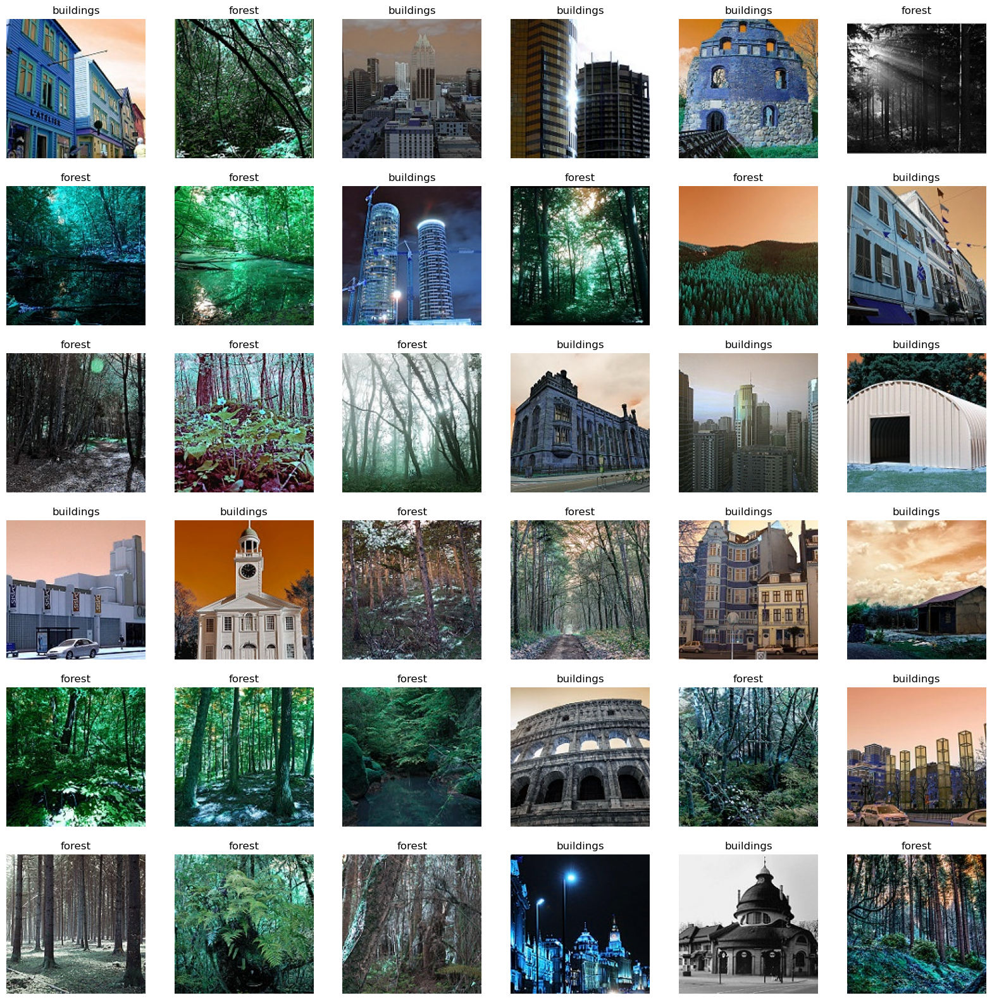

In [15]:
show_images(x_train,y_train)

In [16]:
x_test = []
y_test = []

for folder in os.listdir(test_path):
    files = gb.glob(pathname = str(test_path + '//' + folder + '/*jpg'))
    for file in files:
        imge = cv2.imread(file)
        imge = imge/255.0
        imge_arr = cv2.resize(imge ,(size_images, size_images))
        x_test.append(list(imge_arr))
        y_test.append(folder)

print(f'we have {len(x_test)} in x_test')
print(f'we have {len(y_test)} in y_test')

we have 911 in x_test
we have 911 in y_test


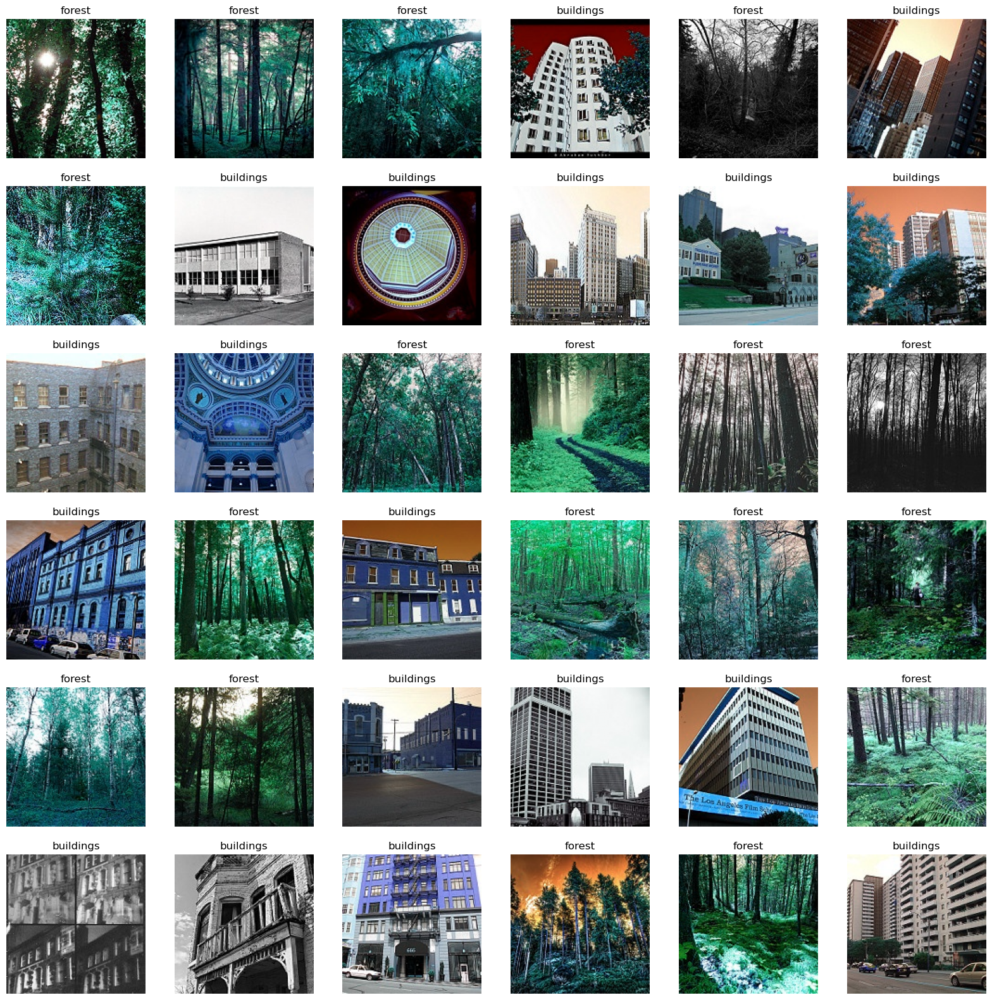

In [17]:
show_images(x_test,y_test)

In [18]:
x_train = np.array(x_train)
x_test = np.array(x_test)

print(f'x_train shape is {x_train.shape}')
print(f'x_test shape is {x_test.shape}')

x_train shape is (4443, 150, 150, 3)
x_test shape is (911, 150, 150, 3)


In [19]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_test = label_encoder.fit_transform(y_test)
y_train = label_encoder.fit_transform(y_train)

In [20]:
model = tf.keras.models.Sequential([
    layers.Conv2D(32,kernel_size=(3,3),activation='relu'),
    layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
    layers.MaxPool2D(2,2),
    layers.Dropout(0.2),

    layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
    layers.Conv2D(128,kernel_size=(3,3),activation='relu'),
    layers.MaxPool2D(2,2),
    layers.Dropout(0.2),

    layers.Flatten(),

    layers.Dense(128,activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(2,activation='softmax'),
])

In [21]:
model.compile(optimizer="adam",
             loss="sparse_categorical_crossentropy",
              metrics=['accuracy']
             )

In [22]:
history = model.fit(x_train, y_train,epochs=3, validation_data=(x_test,y_test))

Epoch 1/3
139/139 ━━━━━━━━━━━━━━━━━━━━ 117s 808ms/step - accuracy: 0.7784 - loss: 0.5990 - val_accuracy: 0.9616 - val_loss: 0.1253
Epoch 2/3
139/139 ━━━━━━━━━━━━━━━━━━━━ 112s 807ms/step - accuracy: 0.9527 - loss: 0.1396 - val_accuracy: 0.9671 - val_loss: 0.1023
Epoch 3/3
139/139 ━━━━━━━━━━━━━━━━━━━━ 113s 813ms/step - accuracy: 0.9661 - loss: 0.1036 - val_accuracy: 0.9769 - val_loss: 0.0944


<Figure size 640x480 with 0 Axes>

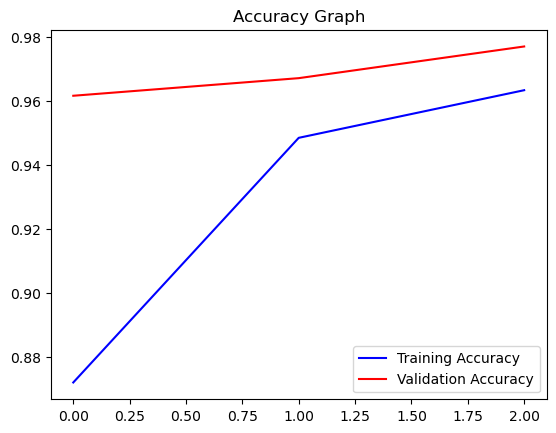

<Figure size 640x480 with 0 Axes>

In [23]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

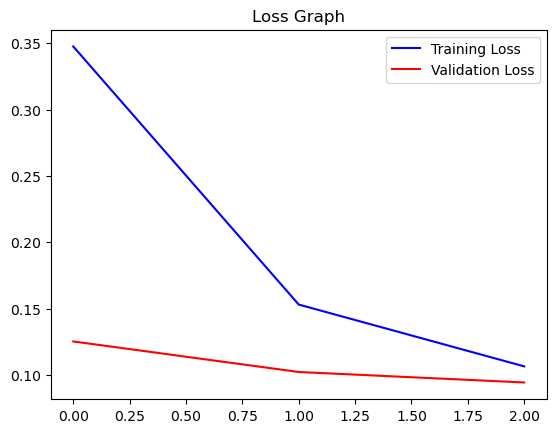

In [24]:
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [31]:
# Predict probabilities for test data
predicted_probabilities = model.predict(x_test)
# Get the class labels by selecting the one with the highest probability
predicted_labels = np.argmax(predicted_probabilities, axis=1)

# Calculate confusion matrix
cm = confusion_matrix(y_test, predicted_labels)
print("Confusion Matrix:")
print(cm)

# Calculate and print classification report
print("Classification Report:")
print(classification_report(y_test, predicted_labels, target_names=label_encoder.classes_))


29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step
Confusion Matrix:
[[431   6]
 [ 15 459]]
Classification Report:
              precision    recall  f1-score   support

   buildings       0.97      0.99      0.98       437
      forest       0.99      0.97      0.98       474

    accuracy                           0.98       911
   macro avg       0.98      0.98      0.98       911
weighted avg       0.98      0.98      0.98       911

